# ButterflAI - Entrenamiento del clasificador de mariposas

> Pablo García Muñoz

> Jairo Andrades Bueno

En este cuaderno se realiza el entrenamiento de una red nueronal capaz de clasificar mariposas (y polillas) según su especie.
Como se observa a lo largo del mismo, esta será capaz de diferenciar entre 100 clases de mariposas distintas, contando con 13.594 imágenes en total para el entrenamiento, validación y testeo.

## Importación de librerías

In [203]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input, BatchNormalization
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow import keras
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from sklearn.preprocessing import label_binarize
from PIL import Image

In [ ]:
# Configura TensorFlow para que use la GPU
physical_devices = tf.config.list_physical_devices('GPU')
print(physical_devices)
if physical_devices:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
#tf.compat.v1.reset_default_graph()

## Manejo del dataset

In [ ]:
# Lee el csv con el dataset
df = pd.read_csv('./butterflies and moths.csv')
df

,class id,filepaths,labels,data set
0,0,train/ADONIS/001.jpg,ADONIS,train
1,0,train/ADONIS/002.jpg,ADONIS,train
2,0,train/ADONIS/003.jpg,ADONIS,train
3,0,train/ADONIS/004.jpg,ADONIS,train
4,0,train/ADONIS/005.jpg,ADONIS,train
...,...,...,...,...
13589,99,valid/ZEBRA LONG WING/1.jpg,ZEBRA LONG WING,valid
13590,99,valid/ZEBRA LONG WING/2.jpg,ZEBRA LONG WING,valid
13591,99,valid/ZEBRA LONG WING/3.jpg,ZEBRA LONG WING,valid
13592,99,valid/ZEBRA LONG WING/4.jpg,ZEBRA LONG WING,valid


In [4]:
# Saca el total de especies disintas
df['labels'].nunique()

100

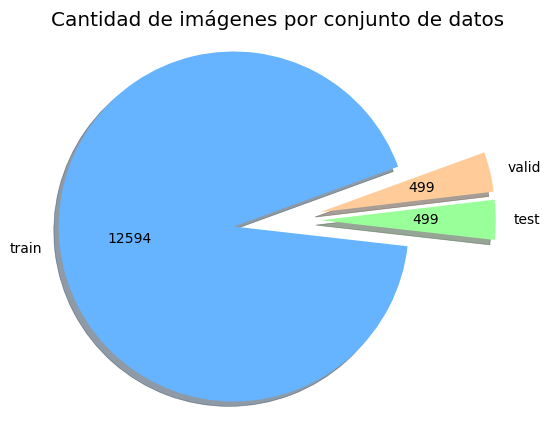

In [178]:
# Saca la cantidad de imágenes por conjunto de datos
set_data_count = df['data set'].value_counts()

# Muestra un gráfico con el porcentaje de imágenes por conjunto de datos
explode = (0.3, 0.2, 0.2)
plt.figure(figsize=(6, 5))
plt.pie(set_data_count, 
        labels=set_data_count.index,
        explode=explode, 
        autopct=lambda p: f'{int(p * sum(set_data_count) / 100)}', 
        startangle=20, 
        shadow=True,
        colors=['#66b3ff', '#99ff99', '#ffcc99'])
plt.axis('equal')
plt.title('Cantidad de imágenes por conjunto de datos')
plt.show()


In [ ]:
# Función para verificar imágenes inválidas y carpetas vacías
def verify_dataset(dataset_path):
    invalid_images = []
    empty_classes = []

    # Itera sobre las carpetas de clases
    for class_name in sorted(os.listdir(dataset_path)):
        class_folder = os.path.join(dataset_path, class_name)

        if not os.listdir(class_folder):  # Verifica si la carpeta está vacía
            empty_classes.append(class_folder)
        else:
            for img_file in os.listdir(class_folder):
                img_path = os.path.join(class_folder, img_file)
                try:
                    img = Image.open(img_path)  # Abre la imagen
                    img.verify()  # Verifica si la imagen es válida
                except (IOError, SyntaxError):  # Captura errores en archivos corruptos
                    invalid_images.append(img_path)

    # Resultados
    if empty_classes:
        print("Clases vacías encontradas:")
        for empty in empty_classes:
            print(empty)
    else:
        print("No se encontraron clases vacías.")

    if invalid_images:
        print("\nImágenes inválidas encontradas:")
        for invalid in invalid_images:
            print(invalid)
    else:
        print("No se encontraron imágenes inválidas.")

In [ ]:
dataset_path = "./"
train_path = os.path.join(dataset_path, "train")
test_path = os.path.join(dataset_path, "test")
valid_path = os.path.join(dataset_path, "valid")

# Llama a la función para verificar los conjuntos de datos
print("Verificación de train:")
verify_dataset(train_path)
print("Verificación de test:")
verify_dataset(test_path)
print("Verificación de valid:")
verify_dataset(valid_path)

Verificación de train:
No se encontraron clases vacías.
No se encontraron imágenes inválidas.
Verificación de test:
No se encontraron clases vacías.
No se encontraron imágenes inválidas.
Verificación de valid:
No se encontraron clases vacías.
No se encontraron imágenes inválidas.


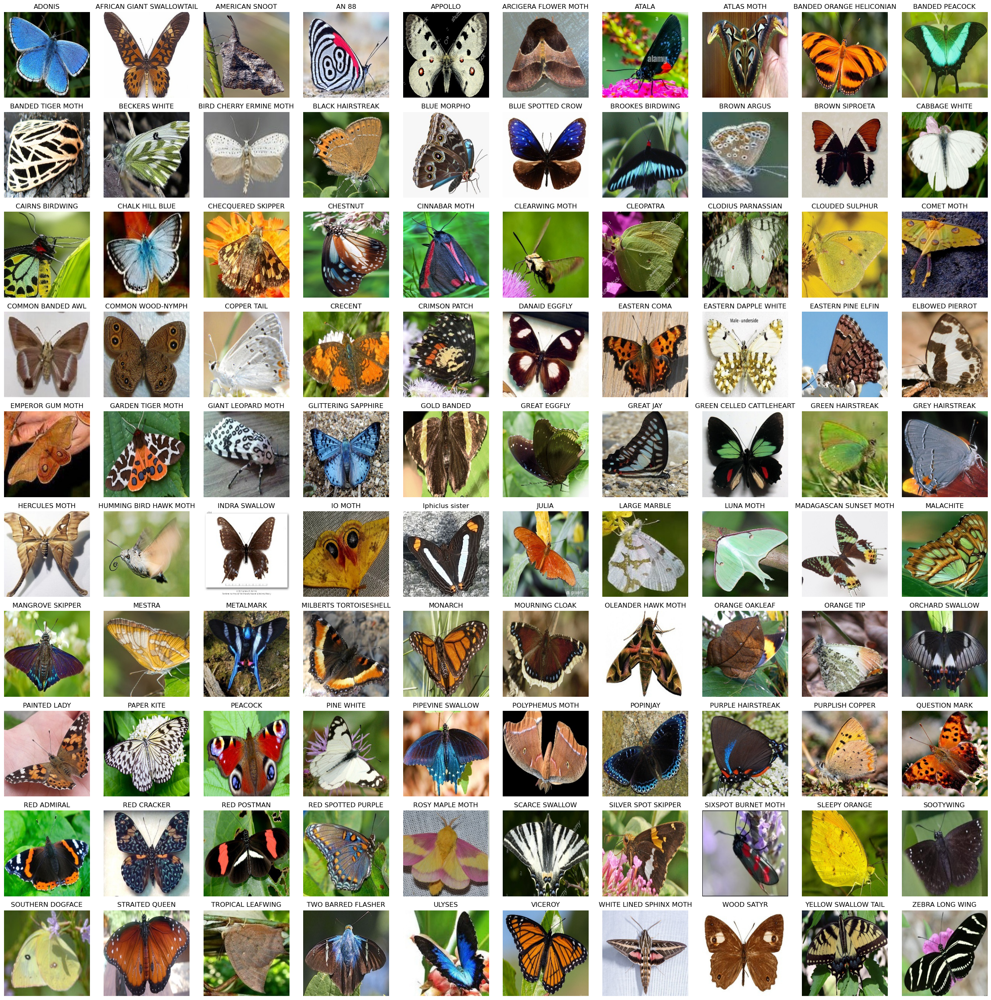

In [ ]:
# Clases del entrenamiento
classes = os.listdir(train_path)

# Muestra la primera imagen de cada clase
plt.figure(figsize=(25, 25))
for i, class_name in enumerate(classes):
    # Carpeta de cada clase
    class_folder = os.path.join(train_path, class_name)

    # Primera imagen de cada clase
    image_name = os.listdir(class_folder)[0]
    # Ruta de la imagen
    image_path = os.path.join(class_folder, image_name)

    # Carga la imagen
    img = image.load_img(image_path, target_size=(224, 224))
    # Muestra imagen
    plt.subplot(10, 10, i+1)
    plt.imshow(img)
    plt.title(class_name)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# Muestra la cantidad de imágenes por mariposa en el conjunto de entrenamiento
df[df['data set'] == 'train']['labels'].value_counts()

MOURNING CLOAK         187
GREEN HAIRSTREAK       176
BROWN ARGUS            169
BROOKES BIRDWING       165
SLEEPY ORANGE          152
                      ... 
ZEBRA LONG WING        104
CRIMSON PATCH          103
MALACHITE              103
WOOD SATYR             102
SIXSPOT BURNET MOTH    100
Name: labels, Length: 100, dtype: int64

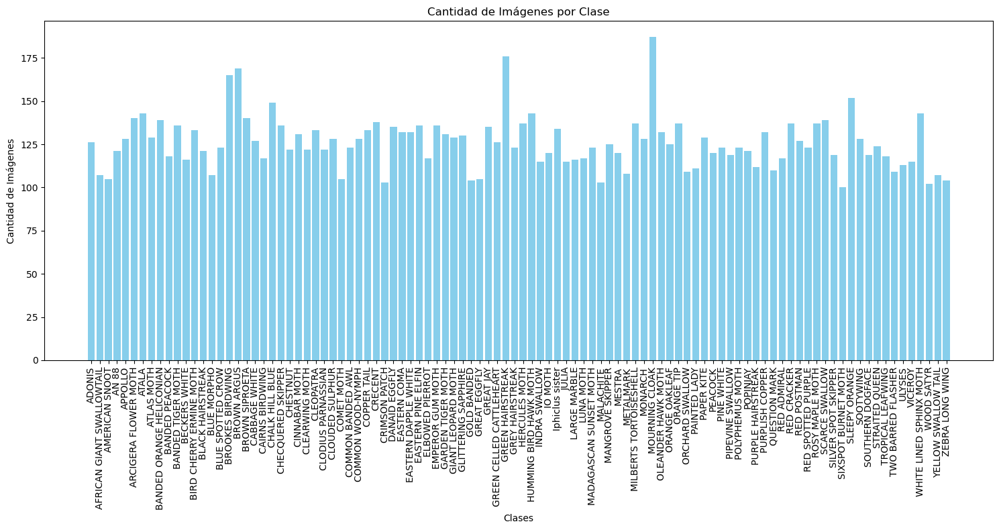

In [115]:
# Cuenta las imágenes en cada clase
data = {}
for class_name in os.listdir(train_path):
    class_path = os.path.join(train_path, class_name)
    if os.path.isdir(class_path):
        data[class_name] = len([file for file in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, file))])

# Extrae las clases y las cantidades
clases = list(data.keys())
cantidades = list(data.values())

# Crea la gráfica
plt.figure(figsize=(15, 8))
plt.bar(clases, cantidades, color='skyblue')
plt.xlabel('Clases')
plt.ylabel('Cantidad de Imágenes')
plt.title('Cantidad de Imágenes por Clase')
plt.xticks(rotation=90)  # Rota etiquetas, las alinea a la derecha y añade padding
plt.tight_layout()
plt.show()

In [7]:
# Muestra la cantidad mínima y máxima de imágenes para una especie para los datos de prueba
df[df['data set'] == 'test']['labels'].value_counts().min(), df[df['data set'] == 'test']['labels'].value_counts().max()

(5, 5)

In [8]:
# Muestra la cantidad mínima y máxima de imágenes para una especie para los datos de validación
df[df['data set'] == 'valid']['labels'].value_counts().min(), df[df['data set'] == 'valid']['labels'].value_counts().max()

(5, 5)

Podemos ver que, como mínimo, tenemos 100 imágenes por especie, llegando a las 187 como máximo en el conjunto de entrenamiento.

Por otro lado, para los datos de prueba y validación hay 5 por especie.

In [9]:
# Saca el diccionario con la clase de la especie y su nombre
dict_name = dict(zip( df['class id'], df['labels']))
dict_name

{0: 'ADONIS',
 1: 'AFRICAN GIANT SWALLOWTAIL',
 2: 'AMERICAN SNOOT',
 3: 'AN 88',
 4: 'APPOLLO',
 5: 'ARCIGERA FLOWER MOTH',
 6: 'ATALA',
 7: 'ATLAS MOTH',
 8: 'BANDED ORANGE HELICONIAN',
 9: 'BANDED PEACOCK',
 10: 'BANDED TIGER MOTH',
 11: 'BECKERS WHITE',
 12: 'BIRD CHERRY ERMINE MOTH',
 13: 'BLACK HAIRSTREAK',
 14: 'BLUE MORPHO',
 15: 'BLUE SPOTTED CROW',
 16: 'BROOKES BIRDWING',
 17: 'BROWN ARGUS',
 18: 'BROWN SIPROETA',
 19: 'CABBAGE WHITE',
 20: 'CAIRNS BIRDWING',
 21: 'CHALK HILL BLUE',
 22: 'CHECQUERED SKIPPER',
 23: 'CHESTNUT',
 24: 'CINNABAR MOTH',
 25: 'CLEARWING MOTH',
 26: 'CLEOPATRA',
 27: 'CLODIUS PARNASSIAN',
 28: 'CLOUDED SULPHUR',
 29: 'COMET MOTH',
 30: 'COMMON BANDED AWL',
 31: 'COMMON WOOD-NYMPH',
 32: 'COPPER TAIL',
 33: 'CRECENT',
 34: 'CRIMSON PATCH',
 35: 'DANAID EGGFLY',
 36: 'EASTERN COMA',
 37: 'EASTERN DAPPLE WHITE',
 38: 'EASTERN PINE ELFIN',
 39: 'ELBOWED PIERROT',
 40: 'EMPEROR GUM MOTH',
 41: 'GARDEN TIGER MOTH',
 42: 'GIANT LEOPARD MOTH',
 43: 'GLITTER

In [ ]:
# Carga todas las imágenes en el dataframe como un array y las normaliza entre 0 y 1
df['image'] = df['filepaths'].apply(lambda x: img_to_array(load_img(f"../{x}", target_size=(224, 224))) / 255)

In [ ]:
# Muestra las primeras 5 filas del dataframe
df.head()

,class id,filepaths,labels,data set,image
0,0,train/ADONIS/001.jpg,ADONIS,train,"[[[0.0, 0.023529412, 0.019607844], [0.0, 0.050..."
1,0,train/ADONIS/002.jpg,ADONIS,train,"[[[0.33333334, 0.29803923, 0.12941177], [0.313..."
2,0,train/ADONIS/003.jpg,ADONIS,train,"[[[0.50980395, 0.48235294, 0.3019608], [0.5098..."
3,0,train/ADONIS/004.jpg,ADONIS,train,"[[[0.54509807, 0.5254902, 0.29803923], [0.5450..."
4,0,train/ADONIS/005.jpg,ADONIS,train,"[[[0.61960787, 0.654902, 0.2901961], [0.619607..."


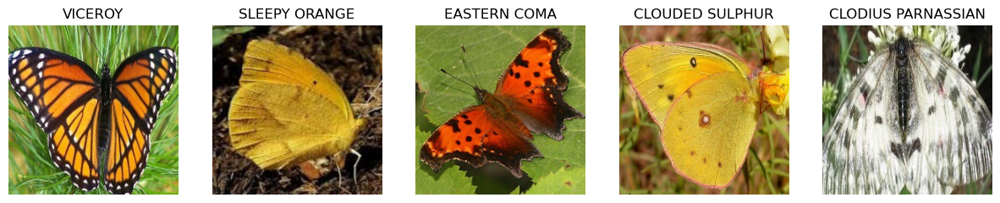

In [ ]:
# Muestra 5 imágenes aleatorias de prueba
df_sample = df[['image', 'labels']].sample(5)
plt.figure(figsize=(15, 15))
for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.imshow(df_sample.iloc[i, 0])
    plt.title(df_sample.iloc[i, 1])
    plt.axis('off')
plt.show()

## Conjunto de entrenamiento, validación y prueba

In [14]:
# Separa en datos de entrenamiento, validación y prueba
train_df = df[df['data set'] == 'train'][['class id', 'image']]
valid_df = df[df['data set'] == 'valid'][['class id', 'image']]
test_df = df[df['data set'] == 'test'][['class id', 'image']]

In [ ]:
# Mezcla los datos de entrenamiento
train_df = train_df.sample(frac=1).reset_index(drop=True)
train_df

,class id,image
0,26,"[[[0.3372549, 0.27450982, 0.14117648], [0.3294..."
1,81,"[[[0.8156863, 0.54901963, 0.29411766], [0.8470..."
2,4,"[[[0.16470589, 0.15686275, 0.105882354], [0.16..."
3,39,"[[[0.83137256, 0.8156863, 0.78039217], [0.7725..."
4,97,"[[[0.49803922, 0.58431375, 0.3019608], [0.4941..."
...,...,...
12589,28,"[[[0.2509804, 0.34509805, 0.10980392], [0.2549..."
12590,32,"[[[0.41568628, 0.35686275, 0.24313726], [0.411..."
12591,37,"[[[0.60784316, 0.5764706, 0.4862745], [0.60784..."
12592,76,"[[[0.627451, 0.58431375, 0.5137255], [0.631372..."


In [ ]:
# Mezcla los datos de validación
valid_df = valid_df.sample(frac=1).reset_index(drop=True)
valid_df

,class id,image
0,3,"[[[0.5568628, 0.40784314, 0.26666668], [0.5529..."
1,12,"[[[0.26666668, 0.5882353, 0.101960786], [0.243..."
2,70,"[[[0.34117648, 0.30980393, 0.26666668], [0.317..."
3,11,"[[[0.78039217, 0.78431374, 0.8], [0.78431374, ..."
4,92,"[[[0.7490196, 0.6431373, 0.60784316], [0.75294..."
...,...,...
495,41,"[[[0.6901961, 0.7294118, 0.827451], [0.7019608..."
496,34,"[[[0.6039216, 0.43137255, 0.29411766], [0.5960..."
497,3,"[[[0.15294118, 0.19607843, 0.17254902], [0.152..."
498,69,"[[[1.0, 1.0, 1.0], [1.0, 1.0, 1.0], [1.0, 1.0,..."


In [ ]:
# Mezcla los datos de prueba
test_df = test_df.sample(frac=1).reset_index(drop=True)
test_df

,class id,image
0,85,"[[[0.35686275, 0.47843137, 0.30588236], [0.356..."
1,70,"[[[0.60784316, 0.6313726, 0.011764706], [0.580..."
2,76,"[[[0.4509804, 0.58431375, 0.14509805], [0.4784..."
3,25,"[[[0.3019608, 0.21176471, 0.047058824], [0.305..."
4,5,"[[[0.48235294, 0.36862746, 0.30588236], [0.403..."
...,...,...
495,0,"[[[0.48235294, 0.53333336, 0.25882354], [0.478..."
496,91,"[[[0.62352943, 0.6509804, 0.6901961], [0.61960..."
497,84,"[[[0.0, 0.011764706, 0.03137255], [0.18431373,..."
498,37,"[[[0.3529412, 0.3254902, 0.15294118], [0.34509..."


In [ ]:
# Separa las imágenes y las etiquetas de los datos de entrenamiento
X_train, y_train = train_df['image'], train_df['class id']

In [ ]:
# Muestra el conjunto de datos de entrenamiento
X_train

0        [[[0.3372549, 0.27450982, 0.14117648], [0.3294...
1        [[[0.8156863, 0.54901963, 0.29411766], [0.8470...
2        [[[0.16470589, 0.15686275, 0.105882354], [0.16...
3        [[[0.83137256, 0.8156863, 0.78039217], [0.7725...
4        [[[0.49803922, 0.58431375, 0.3019608], [0.4941...
                               ...                        
12589    [[[0.2509804, 0.34509805, 0.10980392], [0.2549...
12590    [[[0.41568628, 0.35686275, 0.24313726], [0.411...
12591    [[[0.60784316, 0.5764706, 0.4862745], [0.60784...
12592    [[[0.627451, 0.58431375, 0.5137255], [0.631372...
12593    [[[0.07450981, 0.08235294, 0.03137255], [0.117...
Name: image, Length: 12594, dtype: object

In [ ]:
# Muestra las etiquetas de entrenamiento
y_train

0        26
1        81
2         4
3        39
4        97
         ..
12589    28
12590    32
12591    37
12592    76
12593    27
Name: class id, Length: 12594, dtype: int64

In [ ]:
# Separa las imágenes y las etiquetas de validación
X_valid, y_valid = valid_df['image'], valid_df['class id']

In [ ]:
# Separa las imágenes y las etiquetas de prueba
X_test, y_test = test_df['image'], test_df['class id']

In [ ]:
# Saca el número de clases
num_classes = y_train.nunique()

In [ ]:
# Convierte las etiquetas de entrenamiento en one-hot
y_train = tf.keras.utils.to_categorical(y_train, num_classes=num_classes)
y_train

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [ ]:
# Convierte las etiquetas de validación en one-hot
y_valid = tf.keras.utils.to_categorical(y_valid, num_classes=num_classes)
y_valid

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [ ]:
# Convierte las etiquetas de prueba en one-hot
y_test = tf.keras.utils.to_categorical(y_test, num_classes=num_classes)
y_test

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [ ]:
# Comprueba el tipo de cada conjunto de datos
X_train.dtype, y_train.dtype, X_valid.dtype, y_valid.dtype, X_test.dtype, y_test.dtype

(dtype('O'),
 dtype('float32'),
 dtype('O'),
 dtype('float32'),
 dtype('O'),
 dtype('float32'))

In [ ]:
# Cambia los conjuntos X a tipo flotante
X_train = np.array(X_train.tolist())
X_valid = np.array(X_valid.tolist())
X_test = np.array(X_test.tolist())

In [ ]:
# Comprueba de nuevo los tipos
X_train.dtype, y_train.dtype, X_valid.dtype, y_valid.dtype, X_test.dtype, y_test.dtype

(dtype('float32'),
 dtype('float32'),
 dtype('float32'),
 dtype('float32'),
 dtype('float32'),
 dtype('float32'))

## Entrenamiento del modelo

In [ ]:
# Define el modelo
model = keras.Sequential([
    # Tamaño de entrada
    Input((224, 224, 3)),
    # Primera capa convolucional
    Conv2D(64, (3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.00005)),
    BatchNormalization(),
    MaxPooling2D(2, 2),
    
    # Segunda capa convolucional
    Conv2D(128, (3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.00005)),
    BatchNormalization(),
    MaxPooling2D(2, 2),
    
    # Tercera capa convolucional
    Conv2D(256, (3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.00005)),
    BatchNormalization(),
    MaxPooling2D(2, 2),
    Dropout(0.2),
    
    # Cuarta capa convolucional
    Conv2D(512, (3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.00005)),
    BatchNormalization(),
    MaxPooling2D(2, 2),
    Dropout(0.3),
    
    # Quinta capa convolucional
    Flatten(),
    Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.00005)),
    BatchNormalization(),
    Dropout(0.4),
    
    # Sexta capa convolucional
    Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.00005)),
    BatchNormalization(),
    Dropout(0.3),
    
    # Capa de salida
    Dense(100, activation='softmax')
])

# Compila el modelo
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001), 
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Muestra el resumen del modelo
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 64)      1792      
                                                                 
 batch_normalization (BatchN  (None, 222, 222, 64)     256       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 128)     73856     
                                                                 
 batch_normalization_1 (Batc  (None, 109, 109, 128)    512       
 hNormalization)                                                 
                                                        

In [ ]:
# Data Augmentation para mejorar la generalización
datagen = ImageDataGenerator(
    rotation_range=30, # Rotación aleatoria en el rango de 30 grados
    width_shift_range=0.2, # Traslación horizontal aleatoria
    height_shift_range=0.2, # Traslación vertical aleatoria
    shear_range=0.2, # Cizallamiento aleatorio (transformación de corte)
    zoom_range=0.2, # Zoom aleatorio in o out de 20%
    horizontal_flip=True,  # Volteo horizontal aleatorio
    fill_mode='nearest', # Rellena los píxeles que faltan con los valores más cercanos
)

In [ ]:
# Ajusta el generador de datos
datagen.fit(X_train)

In [ ]:
# Callbacks para mejorar el entrenamiento
early_stopping = EarlyStopping(
    monitor='val_loss',  # Observa la pérdida en validación
    patience=7,  # Número de épocas sin mejora antes de detener
    restore_best_weights=True  # Recupera los mejores pesos
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',  # Observa la pérdida en validación
    factor=0.5,  # Reduce el LR a la mitad
    patience=3,  # Reduce si no hay mejora en 3 épocas
    min_lr=1e-6  # Límite inferior para el LR
)

# Entrena el modelo
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=64), # Generador de datos de entrenamiento
    epochs=100, # Número de épocas
    batch_size=64, # Tamaño del lote
    validation_data=(X_valid, y_valid), # Datos de validación
    callbacks=[early_stopping, reduce_lr]  # Agrega los callbacks
)


Epoch 1/100
197/197 [==============================] - 99s 490ms/step - loss: 4.0991 - accuracy: 0.1137 - val_loss: 7.8878 - val_accuracy: 0.0220 - lr: 0.0010
Epoch 2/100
197/197 [==============================] - 87s 438ms/step - loss: 3.0964 - accuracy: 0.2608 - val_loss: 6.3396 - val_accuracy: 0.0660 - lr: 0.0010
Epoch 3/100
197/197 [==============================] - 87s 437ms/step - loss: 2.6636 - accuracy: 0.3537 - val_loss: 2.7533 - val_accuracy: 0.3400 - lr: 0.0010
Epoch 4/100
197/197 [==============================] - 87s 438ms/step - loss: 2.3631 - accuracy: 0.4427 - val_loss: 2.2352 - val_accuracy: 0.5080 - lr: 0.0010
Epoch 5/100
197/197 [==============================] - 85s 432ms/step - loss: 2.1605 - accuracy: 0.4998 - val_loss: 1.6800 - val_accuracy: 0.6420 - lr: 0.0010
Epoch 6/100
197/197 [==============================] - 85s 428ms/step - loss: 2.0359 - accuracy: 0.5515 - val_loss: 1.7693 - val_accuracy: 0.6460 - lr: 0.0010
Epoch 7/100
197/197 [=========================

El entrenamiento ha finalizado en la época 82, con una precisión en los datos de entrenamiento y validación de 0.9621 y 0.9420, respectivamente.

In [ ]:
# Guarda el modelo entrenado
model.save('./clasificador.keras')

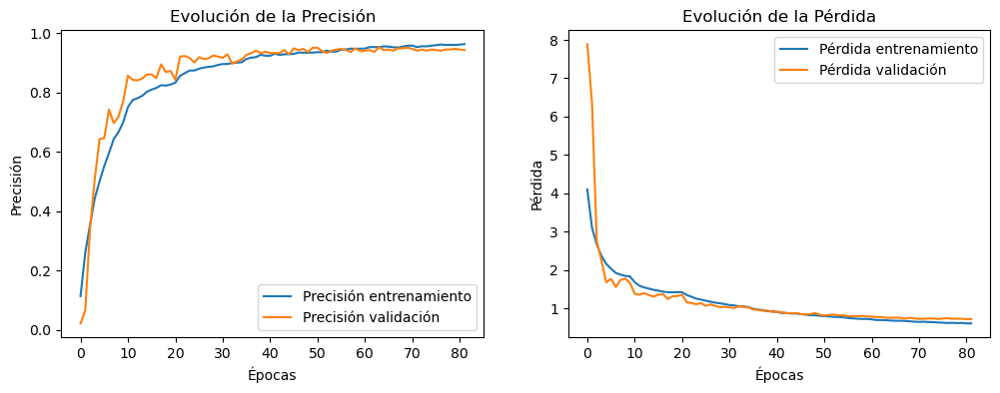

In [ ]:
# Muestra la evolución del entrenamiento
plt.figure(figsize=(12, 4))

# Gráfico de precisión
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Precisión entrenamiento')
plt.plot(history.history['val_accuracy'], label='Precisión validación')
plt.xlabel('Épocas')
plt.ylabel('Precisión')
plt.legend()
plt.title('Evolución de la Precisión')

# Gráfico de pérdida
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Pérdida entrenamiento')
plt.plot(history.history['val_loss'], label='Pérdida validación')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()
plt.title('Evolución de la Pérdida')

plt.show()

## Prueba del modelo

Observamos que funciona perfectamente, consiguiendo una precisión de 0.9620 en los datos de prueba.

In [195]:
# Evalúa el modelo con los datos de prueba
test_loss, test_acc = model.evaluate(X_test, y_test)

16/16 [==============================] - 1s 36ms/step - loss: 0.6589 - accuracy: 0.9620


In [196]:
# Saca la precisión en los datos de prueba
predictions = model.predict(X_test)
# Saca las clases predichas y las verdaderas
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(y_test, axis=1) 

16/16 [==============================] - 1s 34ms/step


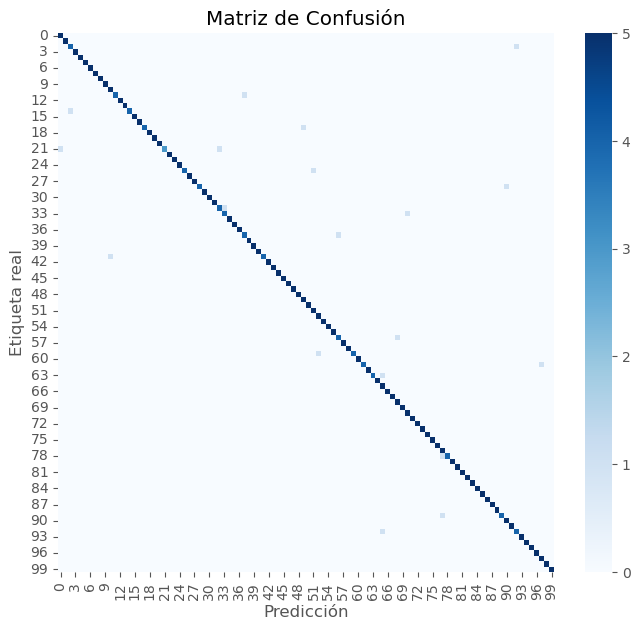

In [197]:
# Muestra la matriz de confusión con los datos de prueba
cm = confusion_matrix(true_classes, predicted_classes)

plt.figure(figsize=(8, 7))
sns.heatmap(cm, annot=False, cmap='Blues', fmt='d')
plt.xlabel('Predicción')
plt.ylabel('Etiqueta real')
plt.title('Matriz de Confusión')
plt.show()


Realizamos un recuento y obtenemos un total de 481 aciertos frente a 19 fallos, es decir, un 3.8% de las imágenes.

In [198]:
# Recoge el total de aciertos y fallos predichos
correct = np.sum(predicted_classes == true_classes)
incorrect = len(true_classes) - correct
correct, incorrect

(481, 19)

In [199]:
# Muestra la precisión y la tasa de error
accuracy = correct / len(true_classes)
error_rate = 1 - accuracy
accuracy, error_rate

(0.962, 0.038000000000000034)

In [200]:
# Recoge los aciertos por clase
correct_classes = {}
for i in range(len(true_classes)):
    if true_classes[i] == predicted_classes[i]:
        if true_classes[i] not in correct_classes:
            correct_classes[true_classes[i]] = 1
        else:
            correct_classes[true_classes[i]] += 1


Por último, vemos los aciertos que se han conseguido por cada clase. Si nos fijamos en el gráfico de barras, solo hay una clase que haya obtenido dos fallos (el resto uno), por lo que en total habrían fallado 18 clases de 100.

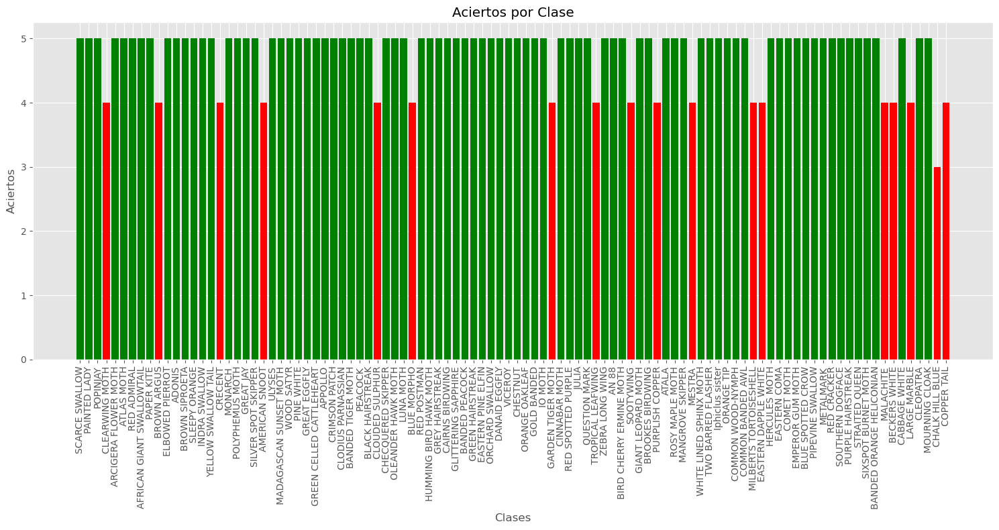

In [201]:
# Muestra un gráfico de barras con los aciertos por clase
plt.figure(figsize=(15, 8))
plt.bar([dict_name[i] for i in correct_classes], [correct_classes[i] for i in correct_classes], color=['red' if correct_classes[i] < 5 else 'green' for i in correct_classes])
plt.xlabel('Clases')
plt.ylabel('Aciertos')
plt.title('Aciertos por Clase')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


In [202]:
# Genera un informe de clasificación
report = classification_report(true_classes, predicted_classes, target_names=[dict_name[i] for i in range(100)])
print(report)


                           precision    recall  f1-score   support

                   ADONIS       0.83      1.00      0.91         5
AFRICAN GIANT SWALLOWTAIL       1.00      1.00      1.00         5
           AMERICAN SNOOT       0.80      0.80      0.80         5
                    AN 88       1.00      1.00      1.00         5
                  APPOLLO       1.00      1.00      1.00         5
     ARCIGERA FLOWER MOTH       1.00      1.00      1.00         5
                    ATALA       1.00      1.00      1.00         5
               ATLAS MOTH       1.00      1.00      1.00         5
 BANDED ORANGE HELICONIAN       1.00      1.00      1.00         5
           BANDED PEACOCK       1.00      1.00      1.00         5
        BANDED TIGER MOTH       0.83      1.00      0.91         5
            BECKERS WHITE       1.00      0.80      0.89         5
  BIRD CHERRY ERMINE MOTH       1.00      1.00      1.00         5
         BLACK HAIRSTREAK       1.00      1.00      1.00     

El modelo muestra un rendimiento excelente en la clasificación de imágenes de mariposas, con una precisión global de 0.96, habiendo obtenido una precisión, recall y f1-score de 1.0 en la mayoría de los casos. 

